In [13]:
import os

from tensorflow import keras

base_img_path = keras.utils.get_file("sf.jpg", origin="https://img-datasets.s3.amazonaws.com/sf.jpg")
style_reference_img_path = keras.utils.get_file("starry_night.jpg",
origin="https://img-datasets.s3.amazonaws.com/starry_night.jpg")

In [14]:
original_width, original_height = keras.utils.load_img(base_img_path).size
img_height = 400
img_width = round(original_width * img_height / original_height)

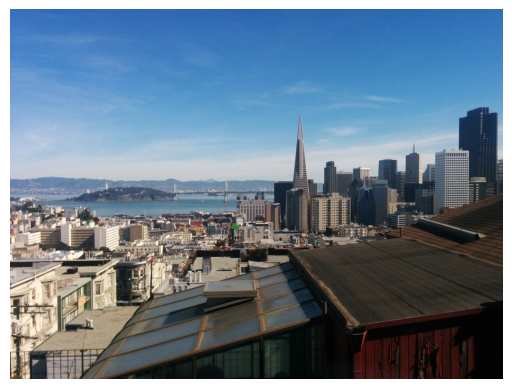

In [15]:
import matplotlib.pyplot as plt

plt.axis('off')
plt.imshow(keras.preprocessing.image.load_img(base_img_path))

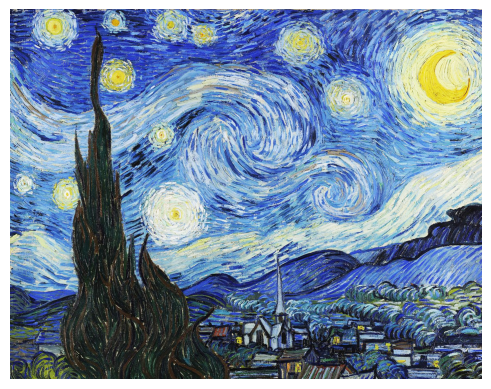

In [16]:
plt.axis('off')
plt.imshow(keras.preprocessing.image.load_img(style_reference_img_path))

In [17]:
import numpy as np

def preprocess_image(image_path):
    img = keras.utils.load_img(
    image_path, target_size=(img_height, img_width))
    img = keras.utils.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = keras.applications.vgg19.preprocess_input(img)
    return img

def deprocess_image(img):
    img = img.reshape((img_height, img_width, 3))
    img[:, :, 0] += 103.939
    img[:, :, 1] += 116.779
    img[:, :, 2] += 123.68
    img = img[:, :, ::-1]
    img = np.clip(img, 0, 255).astype("uint8")
    return img

In [18]:
model = keras.applications.vgg19.VGG19(weights="imagenet", include_top=False)
outputs_dict = dict([(layer.name, layer.output) for layer in model.layers])
feature_extractor = keras.Model(inputs=model.inputs, outputs=outputs_dict)

In [19]:
import tensorflow as tf

def content_loss(base_img, combination_img):
    return tf.reduce_sum(tf.square(combination_img - base_img))

In [20]:
def gram_matrix(x):
    x = tf.transpose(x, (2, 0, 1))
    features = tf.reshape(x, (tf.shape(x)[0], -1))
    gram = tf.matmul(features, tf.transpose(features))
    return gram

def style_loss(style_img, combination_img):
    S = gram_matrix(style_img)
    C = gram_matrix(combination_img)
    channels = 3
    size = img_height * img_width
    return tf.reduce_sum(tf.square(S - C)) / (4.0 * (channels ** 2) * (size ** 2))

In [21]:
def total_variation_loss(x):
    a = tf.square(
    x[:, : img_height - 1, : img_width - 1, :] - x[:, 1:, : img_width - 1, :]
    )
    b = tf.square(
    x[:, : img_height - 1, : img_width - 1, :] - x[:, : img_height - 1, 1:, :]
    )
    return tf.reduce_sum(tf.pow(a + b, 1.25))

In [22]:
style_layer_names = [
    "block1_conv1",
    "block2_conv1",
    "block3_conv1",
    "block4_conv1",
    "block5_conv1"
    ]

content_layer_name = "block5_conv2"
total_variation_weight = 1e-6
style_weight = 1e-6
content_weight = 2.5e-8

In [23]:
def compute_loss(combination_image, base_image, style_reference_image):
    input_tensor = tf.concat([base_image, style_reference_image, combination_image], axis=0)
    features = feature_extractor(input_tensor)
    loss = tf.zeros(shape=())
    layer_features = features[content_layer_name]
    base_image_features = layer_features[0, :, :, :]
    combination_features = layer_features[2, :, :, :]
    loss = loss + content_weight * content_loss(base_image_features, combination_features)
    
    for layer_name in style_layer_names:
        layer_features = features[layer_name]
        style_reference_features = layer_features[1, :, :, :]    
        combination_features = layer_features[2, :, :, :]
        style_loss_value = style_loss(style_reference_features, combination_features)
        loss += (style_weight / len(style_layer_names)) * style_loss_value
    
    loss += total_variation_weight * total_variation_loss(combination_image)
    return loss

In [26]:
@tf.function
def compute_loss_and_grads(combination_image, base_image, style_reference_image):
    with tf.GradientTape() as tape:
        loss = compute_loss(combination_image, base_image, style_reference_image)
    grads = tape.gradient(loss, combination_image)
    return loss, grads

optimizer = tf.keras.optimizers.SGD(keras.optimizers.schedules.ExponentialDecay(initial_learning_rate=100.0, decay_steps=100, decay_rate=0.96))

base_image = preprocess_image(base_img_path)
style_reference_image = preprocess_image(style_reference_img_path)
combination_image = tf.Variable(preprocess_image(base_img_path))

In [29]:
import os

iterations = 4000
os.mkdir('./combination_images/')

In [27]:
for i in range(1, iterations + 1):
    loss, grads = compute_loss_and_grads(combination_image, base_image, style_reference_image)
    optimizer.apply_gradients([(grads, combination_image)])
    if i % 100 == 0:
        print(f"Iteration {i}: loss={loss:.2f}")
        img = deprocess_image(combination_image.numpy())
        fname = f"./combination_images/combination_image_at_iteration_{i}.png"
        keras.utils.save_img(fname, img)

2024-01-02 14:28:24.613085: W tensorflow/compiler/mlir/tools/kernel_gen/transforms/gpu_kernel_to_blob_pass.cc:191] Failed to compile generated PTX with ptxas. Falling back to compilation by driver.
2024-01-02 14:28:24.655007: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8904
2024-01-02 14:28:24.776360: W external/local_xla/xla/stream_executor/gpu/redzone_allocator.cc:322] UNIMPLEMENTED: ptxas ptxas too old. Falling back to the driver to compile.
Relying on driver to perform ptx compilation. 
Modify $PATH to customize ptxas location.
This message will be only logged once.
2024-01-02 14:28:25.197481: W tensorflow/compiler/mlir/tools/kernel_gen/transforms/gpu_kernel_to_blob_pass.cc:191] Failed to compile generated PTX with ptxas. Falling back to compilation by driver.
2024-01-02 14:28:27.463362: I external/local_xla/xla/service/service.cc:168] XLA service 0xa70f750 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices

Iteration 100: loss=8138.65
Iteration 200: loss=6654.99
Iteration 300: loss=6065.32
Iteration 400: loss=5743.90
Iteration 500: loss=5536.71
Iteration 600: loss=5390.36
Iteration 700: loss=5280.50
Iteration 800: loss=5194.73
Iteration 900: loss=5125.58
Iteration 1000: loss=5068.53
Iteration 1100: loss=5020.63
Iteration 1200: loss=4979.74
Iteration 1300: loss=4944.55
Iteration 1400: loss=4913.89
Iteration 1500: loss=4886.81
Iteration 1600: loss=4862.79
Iteration 1700: loss=4841.35
Iteration 1800: loss=4822.15
Iteration 1900: loss=4804.82
Iteration 2000: loss=4789.09
Iteration 2100: loss=4774.79
Iteration 2200: loss=4761.72
Iteration 2300: loss=4749.78
Iteration 2400: loss=4738.82
Iteration 2500: loss=4728.73
Iteration 2600: loss=4719.40
Iteration 2700: loss=4710.75
Iteration 2800: loss=4702.70
Iteration 2900: loss=4695.20
Iteration 3000: loss=4688.19
Iteration 3100: loss=4681.63
Iteration 3200: loss=4675.51
Iteration 3300: loss=4669.79
Iteration 3400: loss=4664.44
Iteration 3500: loss=46

In [33]:
from PIL import Image
import glob

def make_gif(frame_folder):
    frames = [Image.open(image) for image in glob.glob(f"{frame_folder}/*.png")]
    frame_one = frames[0]
    frame_one.save("style_transfer.gif", format="GIF", append_images=frames,
               save_all=True, duration=400, loop=0)

In [34]:
make_gif("./combination_images")

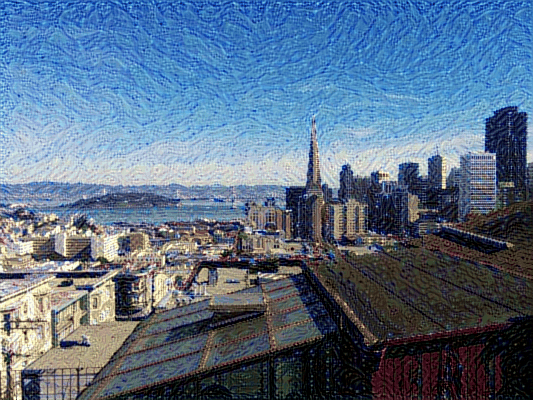

In [38]:
from IPython.display import Image
Image(open('style_transfer.gif','rb').read())